In [19]:
# What kinds of graphs do I want to create?
#
# graph of total rides in Boston for 2022
# graph of total rides in Boston by month
#
# graph of total rides per neighborhood for 2022
# graph of total rides per neighborhood by month
# 
# bar graph of 5 most frequent start stations for 2022
# bar graph of 5 most frequent start stations per month
#
# bar graph of 5 least frequent start stations for 2022
# bar graph of 5 least frequent start stations by month
#
# map for month of January of rides across the city
# map for month of September of rides across the city
#
#
#
#
# ethnic distribution of neighborhoods of most frequent start stations
# ethnic distribution of least frequent start stations
#
# compare with MBTA graphs of these distributions

In [146]:
import numpy as np
import pandas as pd
import folium
import selenium
from IPython.display import Image

In [7]:
# Import the data from other months
jan = pd.read_csv("data/202201-bluebikes-tripdata.csv", low_memory=False)
feb = pd.read_csv("data/202202-bluebikes-tripdata.csv", low_memory=False)
mar = pd.read_csv("data/202203-bluebikes-tripdata.csv", low_memory=False)
apr = pd.read_csv("data/202204-bluebikes-tripdata.csv", low_memory=False)
may = pd.read_csv("data/202205-bluebikes-tripdata.csv", low_memory=False)
jun = pd.read_csv("data/202206-bluebikes-tripdata.csv", low_memory=False)

jul = pd.read_csv("data/202207-bluebikes-tripdata.csv", low_memory=False)
aug = pd.read_csv("data/202208-bluebikes-tripdata.csv", low_memory=False)
sep = pd.read_csv("data/202209-bluebikes-tripdata.csv", low_memory=False)
oct = pd.read_csv("data/202210-bluebikes-tripdata.csv", low_memory=False)
nov = pd.read_csv("data/202211-bluebikes-tripdata.csv", low_memory=False)
dec = pd.read_csv("data/202212-bluebikes-tripdata.csv", low_memory=False)

In [9]:
months = [jan, feb, mar, apr, may, jun, jul, aug, sep, oct, nov, dec]

In [20]:
jan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81613 entries, 0 to 81612
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   tripduration             81613 non-null  int64  
 1   starttime                81613 non-null  object 
 2   stoptime                 81613 non-null  object 
 3   start station id         81613 non-null  int64  
 4   start station name       81613 non-null  object 
 5   start station latitude   81613 non-null  float64
 6   start station longitude  81613 non-null  float64
 7   end station id           81613 non-null  int64  
 8   end station name         81613 non-null  object 
 9   end station latitude     81613 non-null  float64
 10  end station longitude    81613 non-null  float64
 11  bikeid                   81613 non-null  int64  
 12  usertype                 81613 non-null  object 
 13  postal code              78237 non-null  object 
dtypes: float64(4), int64(4

In [23]:
# We need to manipulate this data
# - add whether a station is in Boston
# - add the neighborhood of a station
# - turn this from trips into frequency per station
# 
# Key considerations
# - how can I do this efficiently? get a list of stations and do it once
# per station
# - this means that I should create a "total" frequency dataframe first,
# then apply the functions to each stations successively

In [91]:
month_frequency = []

for i in range(len(months)): 
    station_counts = months[i].groupby('start station name')['start station name'].count().rename('number of rides').reset_index()
    merged = months[i].drop_duplicates('start station name')[['start station name', 'start station latitude', 'start station longitude']].merge(station_counts)
    merged = merged.sort_values(by='number of rides', ascending=False)
    month_frequency.append(merged)

In [118]:
year_frequency = pd.concat(month_frequency)
yearly_sums = year_frequency.groupby('start station name').agg({'number of rides': 'sum'}).reset_index()

year_frequency = yearly_sums.merge(year_frequency.drop_duplicates('start station name')[['start station name', 'start station latitude', 
                                                                                         'start station longitude']])
year_frequency =  year_frequency.sort_values(by='number of rides', ascending=False)

In [119]:
year_frequency

,start station name,number of rides,start station latitude,start station longitude
270,MIT at Mass Ave / Amherst St,85638,42.358100,-71.093198
107,Central Square at Mass Ave / Essex St,67534,42.365070,-71.103100
217,Harvard Square at Mass Ave/ Dunster,60354,42.373268,-71.118579
267,MIT Pacific St at Purrington St,44242,42.359573,-71.101295
113,Charles Circle - Charles St at Cambridge St,41246,42.360793,-71.071190
...,...,...,...,...
3,18 Dorrance Warehouse,37,42.387151,-71.075978
40,BCBS Quincy,29,42.276005,-71.039250
140,Community Life Center,25,42.520136,-70.906271
312,North St at Liberty Hill Ave,11,42.529900,-70.906143


In [103]:
import requests
import time

def in_city(row):
    time.sleep(1.1)
    lat = row['start station latitude']
    long = row['start station longitude']
    r = requests.get(f"https://nominatim.openstreetmap.org/reverse?format=jsonv2&lat={lat}&lon={long}")
    try:
        return r.json()["address"]["city"] == "Boston"
    except:
        return False

In [104]:
boston_stations = year_frequency[year_frequency.apply(in_city, axis=1)]["start station name"]
boston_stations.info()

<class 'pandas.core.series.Series'>
Index: 253 entries, 113 to 3
Series name: start station name
Non-Null Count  Dtype 
--------------  ----- 
253 non-null    object
dtypes: object(1)
memory usage: 4.0+ KB


In [109]:
print(month_frequency[0].info())
print(month_frequency[6].info())
print(year_frequency.info())

<class 'pandas.core.frame.DataFrame'>
Index: 354 entries, 39 to 353
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   start station name       354 non-null    object 
 1   start station latitude   354 non-null    float64
 2   start station longitude  354 non-null    float64
 3   postal code              325 non-null    object 
 4   number of rides          354 non-null    int64  
dtypes: float64(2), int64(1), object(2)
memory usage: 16.6+ KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 430 entries, 60 to 425
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   start station name       430 non-null    object 
 1   start station latitude   430 non-null    float64
 2   start station longitude  430 non-null    float64
 3   postal code              387 non-null    object 
 4   number of rides          

In [143]:
# Filter all stations by city
def station_in_city(row):
    id = row["start station name"]
    return id in list(boston_stations)

boston_stations.to_csv("boston_stations.csv", index=False)

for i in range(len(month_frequency)):
    month_frequency[i] = month_frequency[i][month_frequency[i].apply(station_in_city, axis=1)]

year_frequency = year_frequency[year_frequency.apply(station_in_city, axis=1)]

In [144]:
print(month_frequency[0].info())
print(month_frequency[6].info())
print(year_frequency.info())

<class 'pandas.core.frame.DataFrame'>
Index: 188 entries, 22 to 337
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   start station name       188 non-null    object 
 1   start station latitude   188 non-null    float64
 2   start station longitude  188 non-null    float64
 3   number of rides          188 non-null    int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 11.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 247 entries, 14 to 425
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   start station name       247 non-null    object 
 1   start station latitude   247 non-null    float64
 2   start station longitude  247 non-null    float64
 3   number of rides          247 non-null    int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 9.6+ KB
None
<class 'pandas.co

In [161]:
def neighbourhood(row):
    time.sleep(1.1)
    lat = row['start station latitude']
    long = row['start station longitude']
    r = requests.get(f"https://nominatim.openstreetmap.org/reverse?format=jsonv2&lat={lat}&lon={long}")
    try:
        return r.json()["address"]["suburb"]
    except:
        return np.NaN

In [162]:
# Determine the neighborhood of each station
year_frequency["neighbourhood"] = year_frequency.apply(neighbourhood, axis=1)
year_frequency.head(10)

,start station name,number of rides,start station latitude,start station longitude,neighbourhood
113,Charles Circle - Charles St at Cambridge St,41246,42.360793,-71.071190,Beacon Hill
123,Christian Science Plaza - Massachusetts Ave at...,37786,42.343666,-71.085824,Fenway / Kenmore
136,Commonwealth Ave at Agganis Way,35904,42.351692,-71.119035,Allston
186,Forsyth St at Huntington Ave,35428,42.339202,-71.090511,Fenway / Kenmore
76,Boylston St at Massachusetts Ave,34319,42.347406,-71.086784,Back Bay
255,Landmark Center - Brookline Ave at Park Dr,31597,42.343691,-71.102353,Fenway / Kenmore
46,Beacon St at Massachusetts Ave,31213,42.350827,-71.089811,Fenway / Kenmore
306,Newbury St at Hereford St,30981,42.348717,-71.085954,Back Bay
162,Deerfield St at Commonwealth Ave,29203,42.349244,-71.097282,Allston
153,Cross St at Hanover St,28110,42.362811,-71.056067,North End


In [484]:
year_frequency.to_csv("full_stations.csv", index=False)

In [184]:
# Add this information to all months
# Filter all stations by city
def station_neighbourhood(row):
    station = row["start station name"]
    return year_frequency[year_frequency["start station name"] == station]["neighbourhood"].str.cat()

for i in range(len(month_frequency)):
    month_frequency[i]["neighbourhood"] = month_frequency[i].apply(station_neighbourhood, axis=1)

In [186]:
month_frequency[10].head(10)

,start station name,start station latitude,start station longitude,number of rides,neighbourhood
4,Forsyth St at Huntington Ave,42.339202,-71.090511,3321,Fenway / Kenmore
60,Charles Circle - Charles St at Cambridge St,42.360793,-71.071190,3258,Beacon Hill
224,Boylston St at Massachusetts Ave,42.347406,-71.086784,2983,Back Bay
0,Christian Science Plaza - Massachusetts Ave at...,42.343666,-71.085824,2954,Fenway / Kenmore
33,Commonwealth Ave at Agganis Way,42.351692,-71.119035,2746,Allston
81,Landmark Center - Brookline Ave at Park Dr,42.343691,-71.102353,2495,Fenway / Kenmore
24,Beacon St at Massachusetts Ave,42.350827,-71.089811,2459,Fenway / Kenmore
84,Deerfield St at Commonwealth Ave,42.349244,-71.097282,2409,Allston
42,Newbury St at Hereford St,42.348717,-71.085954,2171,Back Bay
54,Ruggles T Stop - Columbus Ave at Melnea Cass Blvd,42.336244,-71.087986,2093,Fenway / Kenmore


In [187]:
# Question: how many rides are made with Blue Bikes, and where do they start?
# We will consider all 12 months from 2022

# First, create an overall sum of each station and the ones with the largest and 
# fewest number of rides




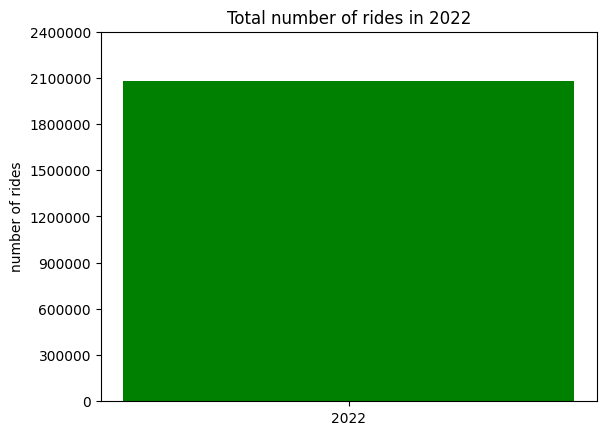

In [211]:
# graph of total rides in Boston for 2022
# graph of total rides in Boston by month

import matplotlib.ticker as ticker
from matplotlib import pyplot as plt

fig, ax = plt.subplots()

dates = "2022"
rides = sum(year_frequency["number of rides"])
bar_labels = dates

ax.bar(dates, rides, label=bar_labels, color='g', width=0.01)

ax.set_ylabel("number of rides")
ax.set_title("Total number of rides in 2022")
plt.yticks(np.arange(0, 2400000+1, 300000))

formatter = ax.yaxis.get_major_formatter()
formatter.set_scientific(False)
formatter.set_useOffset(False)

plt.savefig('year_rides.png')
plt.show()

In [224]:
pd.DataFrame([sum(month_frequency[i]["number of rides"]) for i in range(len(month_frequency))])

,0
0,39430
1,50143
2,93073
3,143926
4,194617
5,224878
6,246693
7,286925
8,355844
9,225637


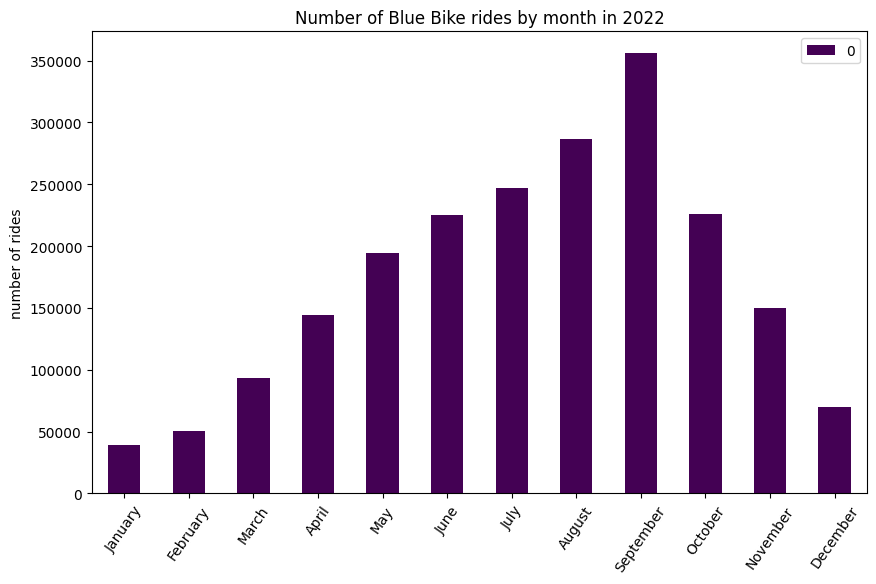

In [236]:
import calendar

fig, ax = plt.subplots()

dates = list(calendar.month_name)[1:]
monthly_plot_data = pd.DataFrame([sum(month_frequency[i]["number of rides"]) for i in range(len(month_frequency))])

monthly_plot_data.plot(ax=ax, kind='bar', figsize=(10,6), colormap='viridis')


ax.set_ylabel("number of rides")
ax.set_title("Number of Blue Bike rides by month in 2022")
ax.set_xticklabels(dates)
plt.xticks(rotation=55)

plt.savefig('month_rides.png')
plt.show()

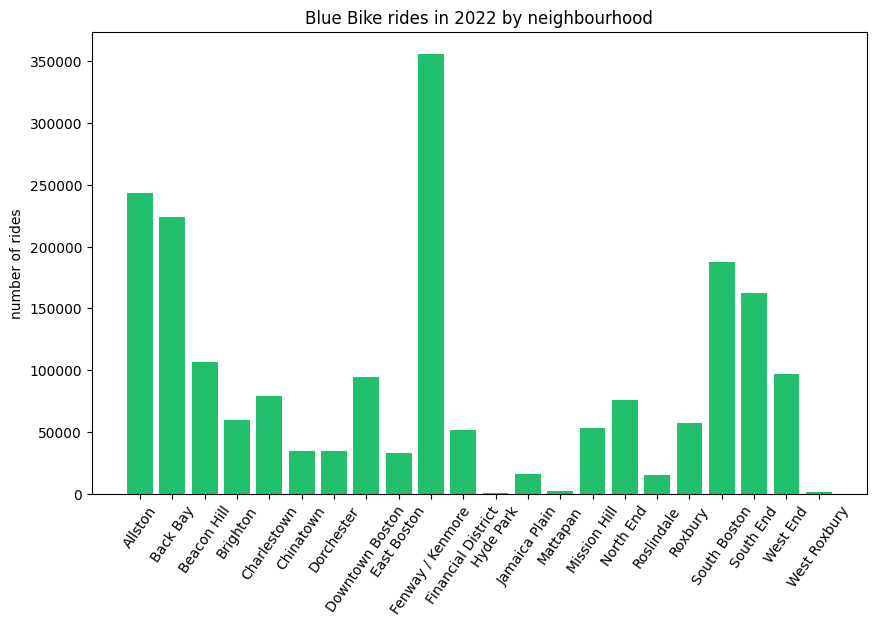

In [248]:
# graph of total rides per neighborhood for 2022
# graph of total rides per neighborhood by month

import matplotlib.ticker as ticker
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

neighbourhoods = year_frequency.groupby("neighbourhood").sum(["number of rides"]).index
rides = year_frequency.groupby("neighbourhood").sum(["number of rides"])["number of rides"]
bar_labels = neighbourhoods

ax.bar(neighbourhoods, rides, label=bar_labels, color='#22c06c')

ax.set_ylabel("number of rides")
ax.set_title("Blue Bike rides in 2022 by neighbourhood")
plt.xticks(rotation=55)

plt.savefig('year_neighbourhood_rides.png')
plt.show()

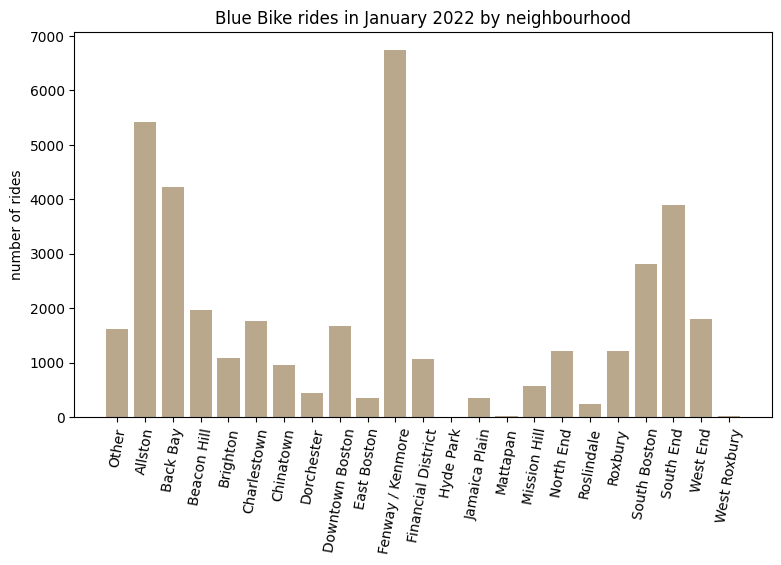

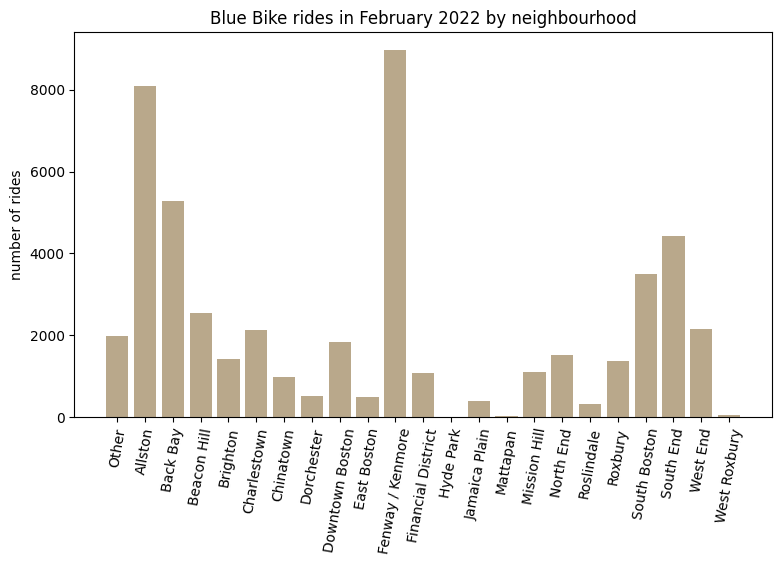

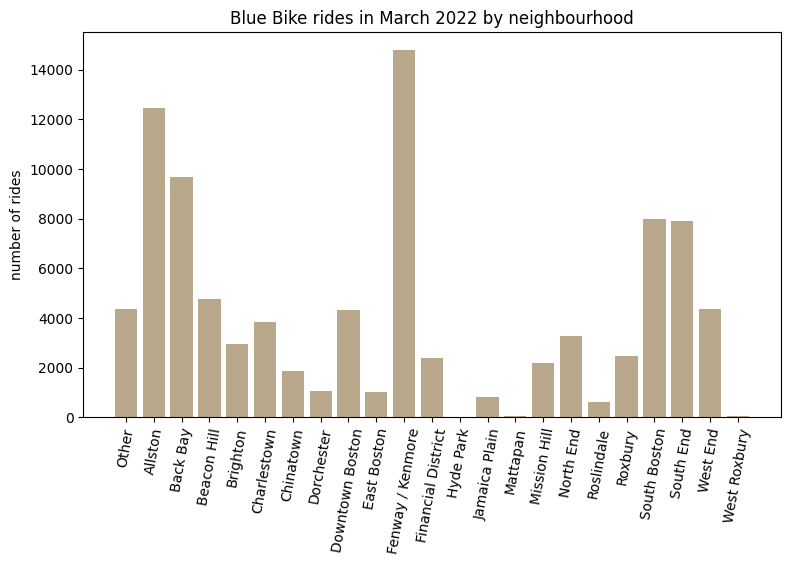

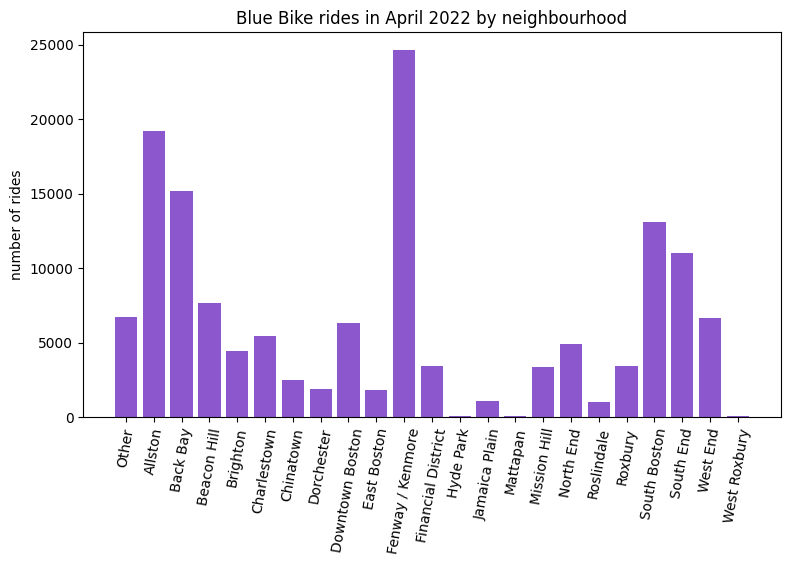

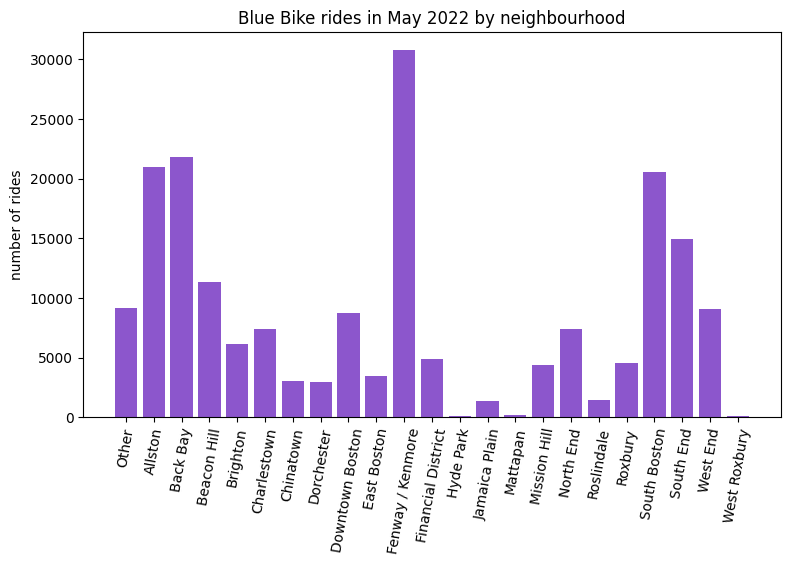

...

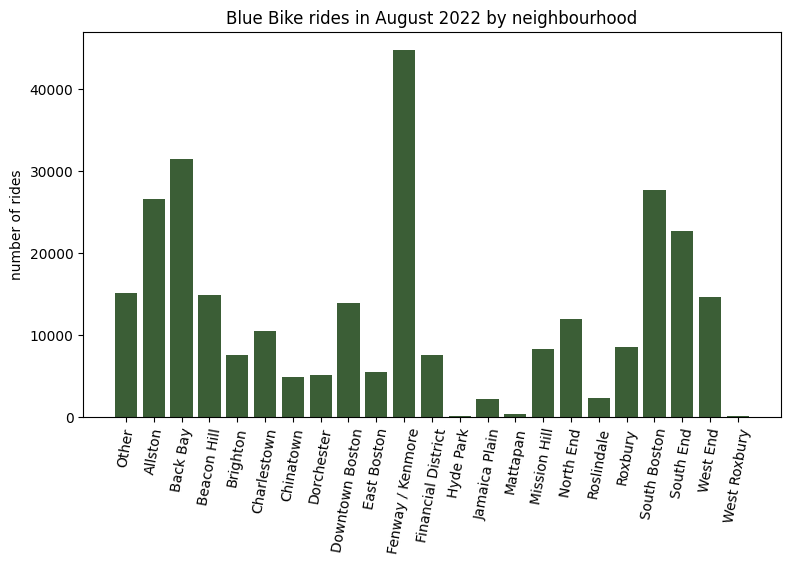

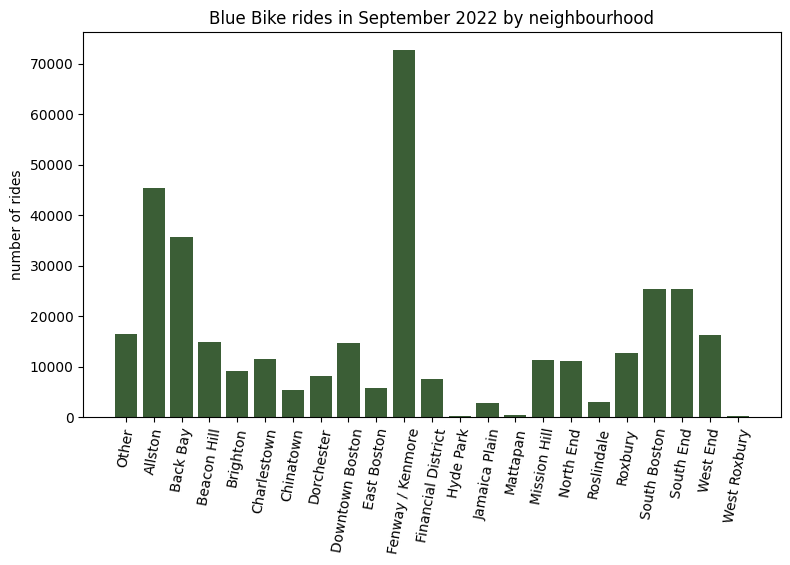

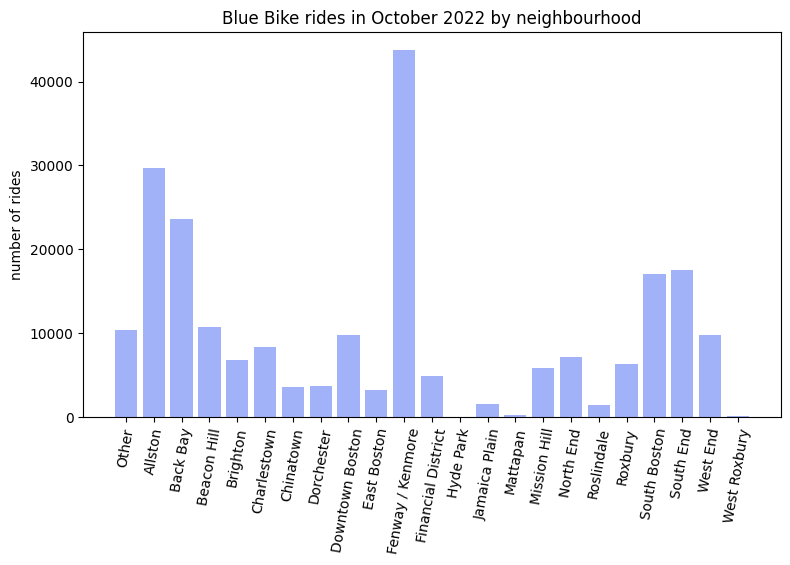

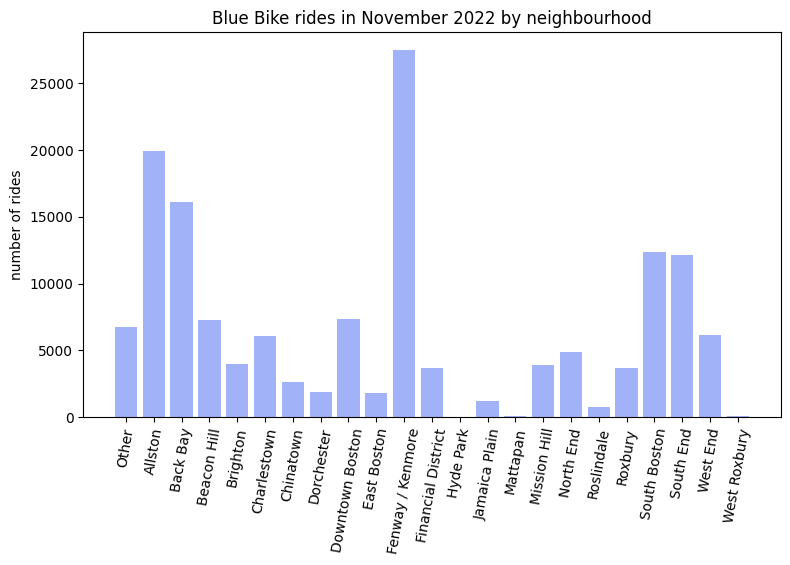

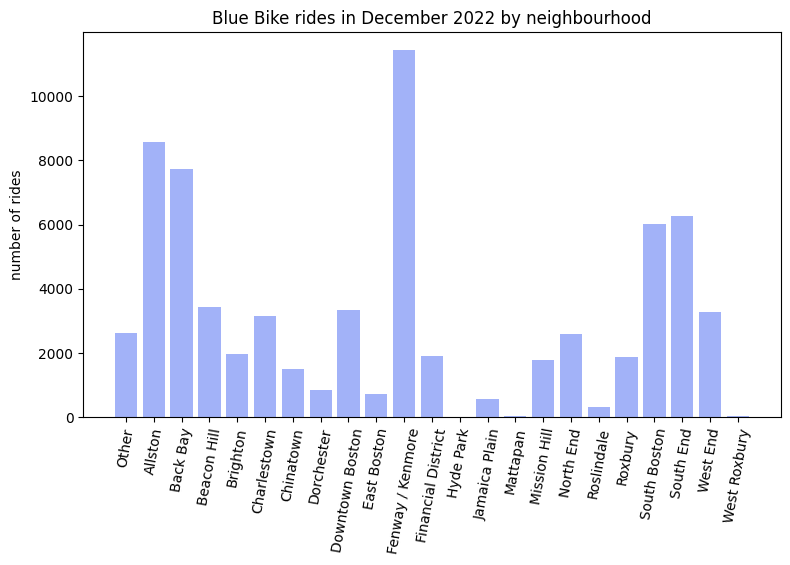

In [271]:
colors = ["#b9a88b", "#8c56cc", "#3b5e36", "#a2b2f8"]

for i in range(len(month_frequency)):
    month = month_frequency[i]
    month_name = calendar.month_name[i + 1]

    fig, ax = plt.subplots(figsize=(9, 5))
    
    neighbourhoods = list(month.groupby("neighbourhood").sum(["number of rides"]).index)
    neighbourhoods[0] =  "Other"
    rides = month.groupby("neighbourhood").sum(["number of rides"])["number of rides"]
    bar_labels = neighbourhoods
    
    ax.bar(neighbourhoods, rides, label=bar_labels, color=colors[i // 3])
    
    ax.set_ylabel("number of rides")
    ax.set_title(f"Blue Bike rides in {month_name} 2022 by neighbourhood")
    plt.xticks(rotation=80)

    if i < 9:
        img_name = f'month_0{i + 1}_neighbourhood_rides.png'
    else:
        img_name = f'month_{i + 1}_neighbourhood_rides.png'
    
    plt.savefig(img_name)
    plt.show()

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


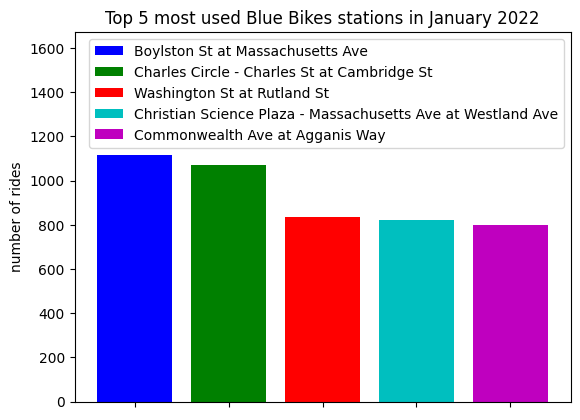

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


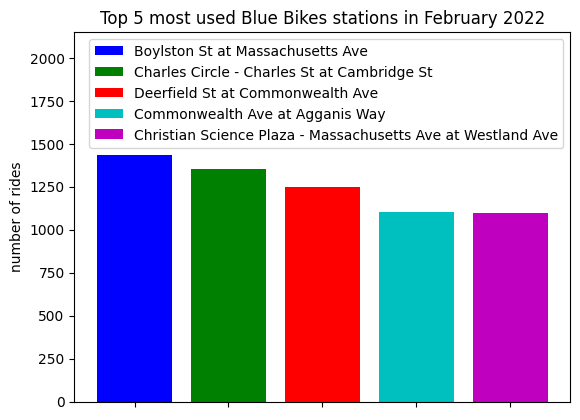

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


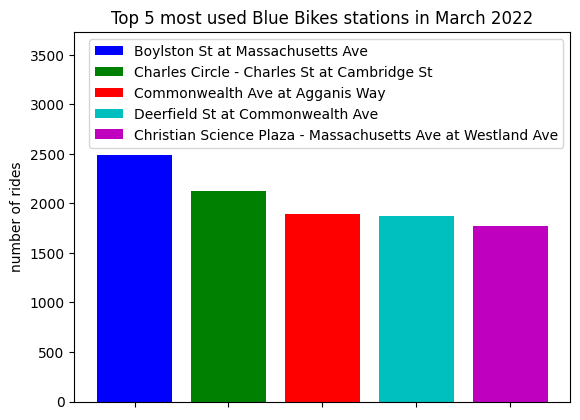

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


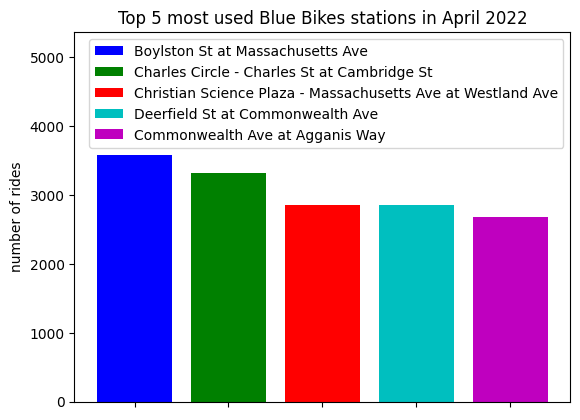

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


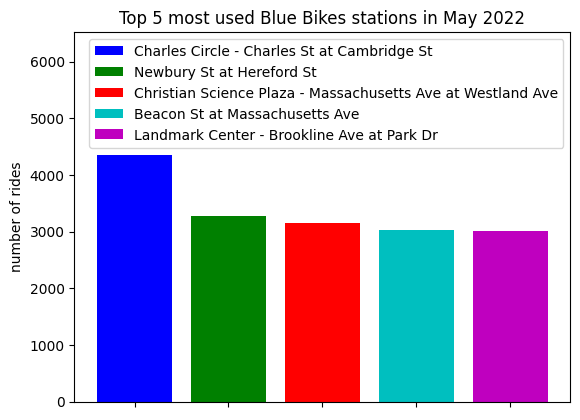

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


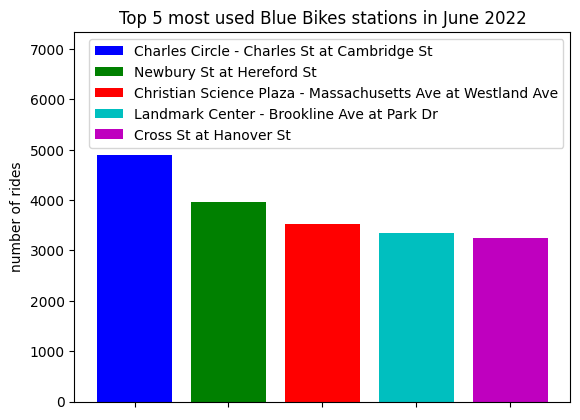

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


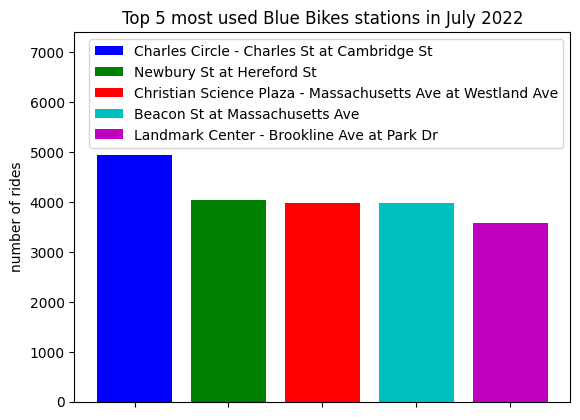

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


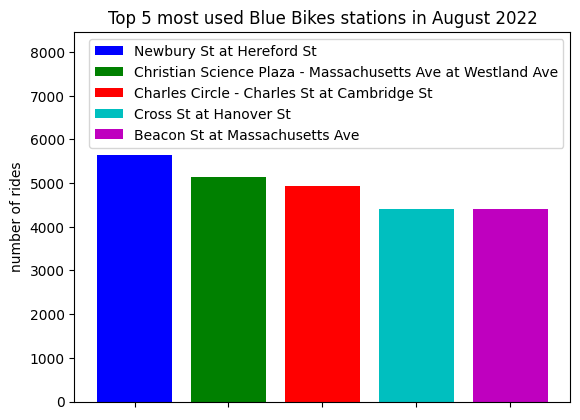

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


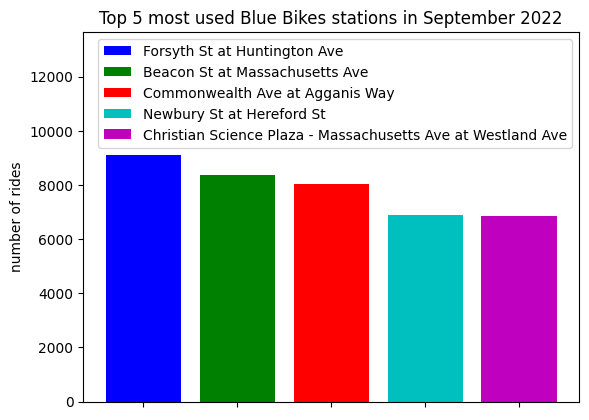

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


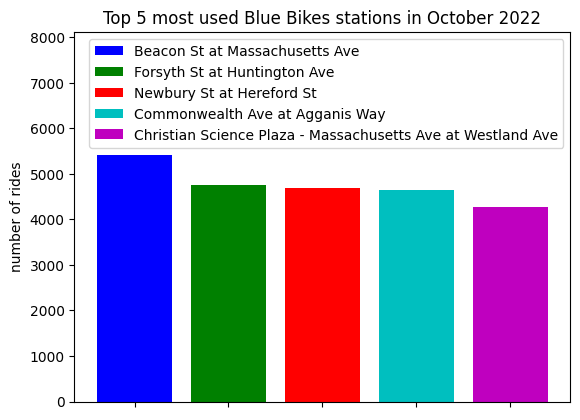

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


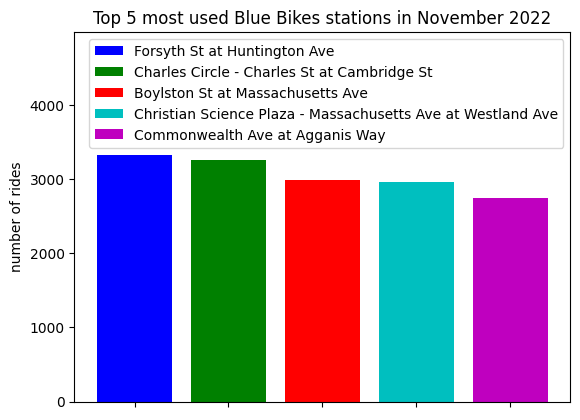

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3488178949.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


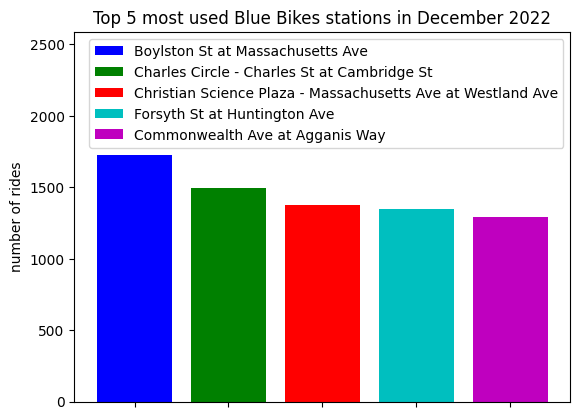

In [296]:
# bar graph of 5 most frequent start stations per month
bar_colors = [x for x in 'bgrcmyk']

for i in range(len(month_frequency)):
    month = month_frequency[i]
    month_name = calendar.month_name[i + 1]

    fig, ax = plt.subplots()
    
    stations = month.sort_values("number of rides", ascending=False)[:5]["start station name"]
    rides = month.sort_values("number of rides", ascending=False)[:5]["number of rides"]
    bar_labels = stations
    
    ax.bar(stations, rides, label=bar_labels, color=bar_colors)
    
    ax.set_ylabel("number of rides")
    ax.set_title(f"Top 5 most used Blue Bikes stations in {month_name} 2022")
    plt.ylim(0, max(rides) * 1.5)
    ax.set_xticklabels(['']*len(ax.get_xticks()))
    ax.tick_params(axis='x', labelsize=8)
    plt.legend()

    if i < 9:
        img_name = f'month_0{i + 1}_most_frequent_stations.png'
    else:
        img_name = f'month_{i + 1}_most_frequent_stations.png'
    
    plt.savefig(img_name)
    plt.show()

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


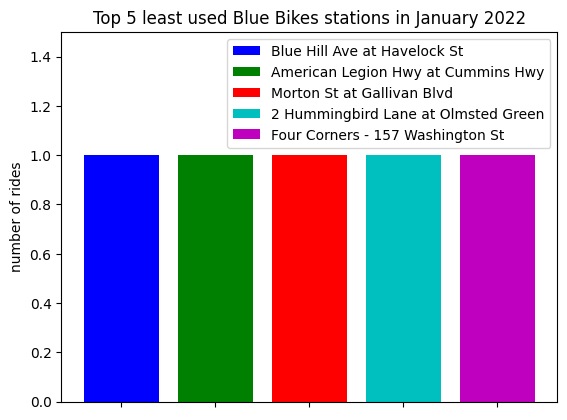

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


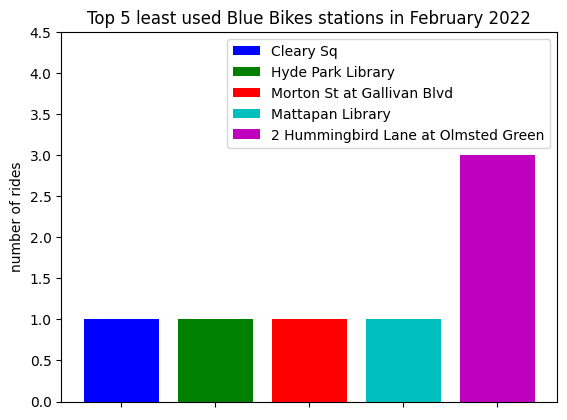

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


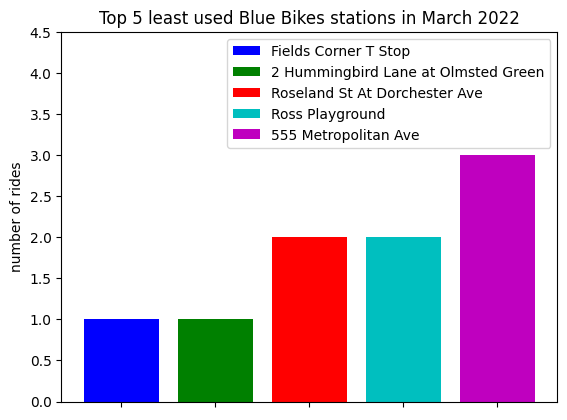

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


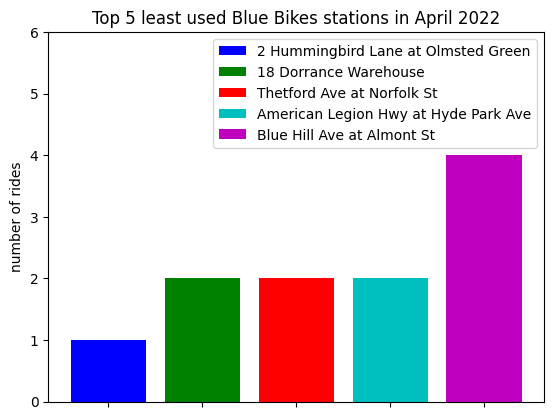

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


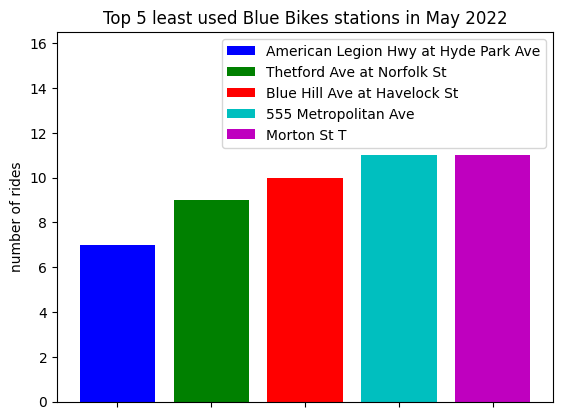

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


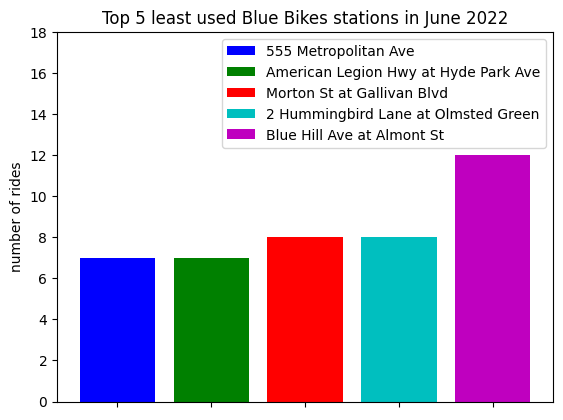

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


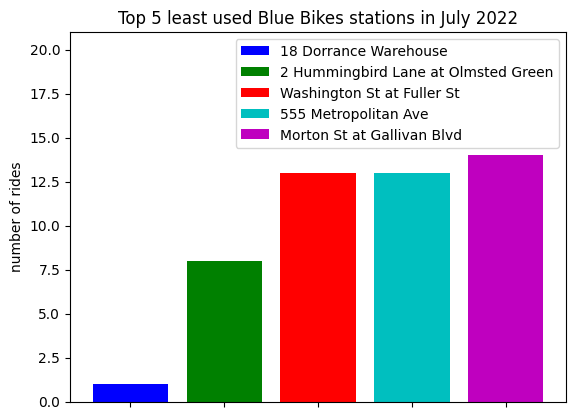

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


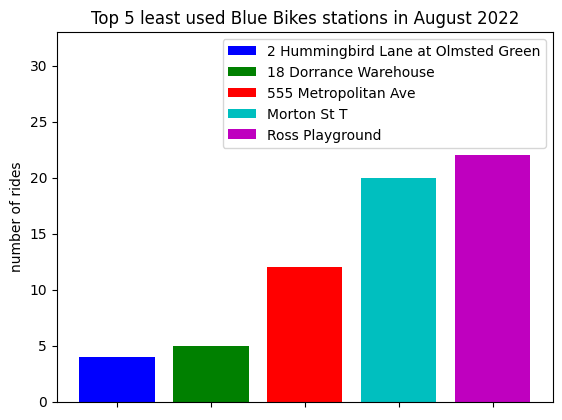

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


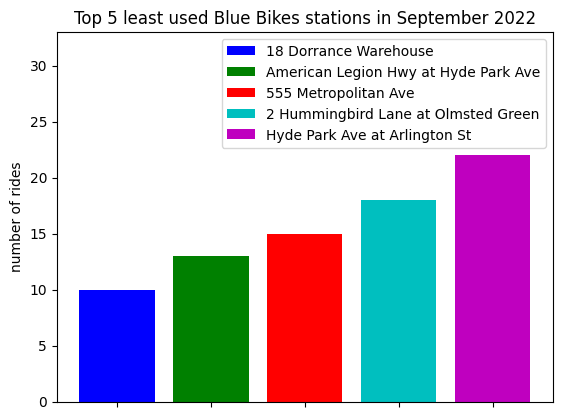

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


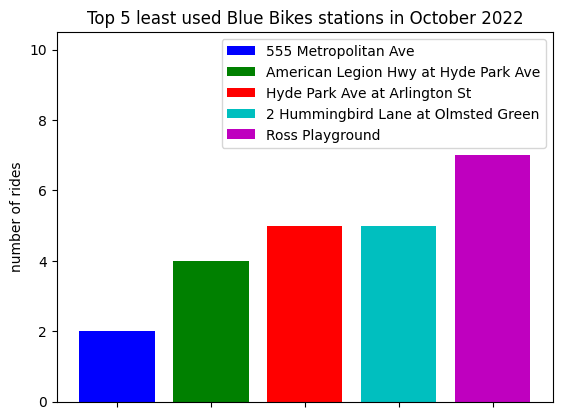

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


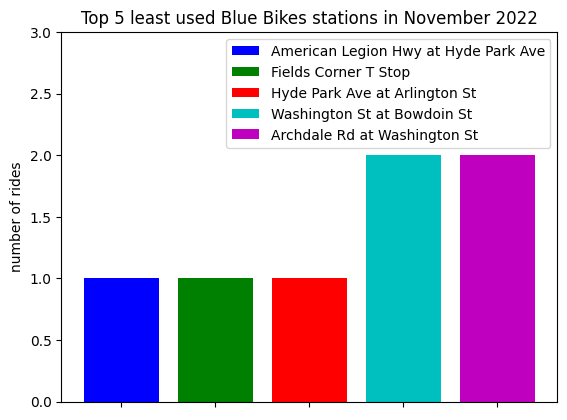

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\2618232448.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['']*len(ax.get_xticks()))


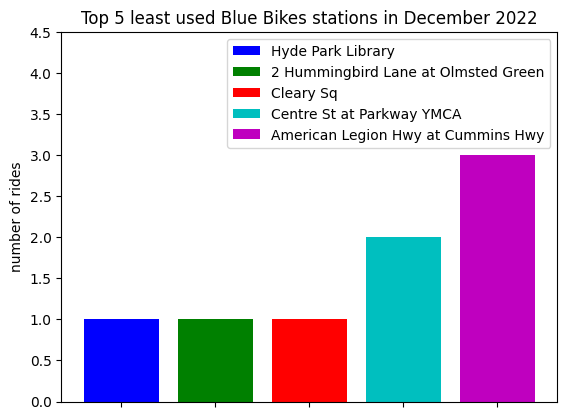

In [298]:
# bar graph of 5 least frequent start stations for 2022
# bar graph of 5 least frequent start stations by month

bar_colors = [x for x in 'bgrcmyk']

for i in range(len(month_frequency)):
    month = month_frequency[i]
    month_name = calendar.month_name[i + 1]

    fig, ax = plt.subplots()
    
    stations = month.sort_values("number of rides", ascending=True)[:5]["start station name"]
    rides = month.sort_values("number of rides", ascending=True)[:5]["number of rides"]
    bar_labels = stations
    
    ax.bar(stations, rides, label=bar_labels, color=bar_colors)
    
    ax.set_ylabel("number of rides")
    ax.set_title(f"Top 5 least used Blue Bikes stations in {month_name} 2022")
    plt.ylim(0, max(rides) * 1.5)
    ax.set_xticklabels(['']*len(ax.get_xticks()))
    ax.tick_params(axis='x', labelsize=8)
    plt.legend()

    if i < 9:
        img_name = f'month_0{i + 1}_least_frequent_stations.png'
    else:
        img_name = f'month_{i + 1}_least_frequent_stations.png'
    
    plt.savefig(img_name)
    plt.show()

In [299]:
def convert_map_to_png(map, filename):
    """
    Method to convert a folium map to a png file by
    saving the map as an html file and then taking a
    screenshot of the html file on the browser.

    map : folium map object
        The map to be converted to a png file
    filename : str, does not include file type
    """
    import os
    import time
    from selenium import webdriver

    html_filename=f'{filename}.html'
    map.save(html_filename)

    tmpurl=f'file://{os.getcwd()}/{html_filename}'
    
    try:
        try:
            browser = webdriver.Firefox()
        except:
            browser = webdriver.Chrome()
    except:
        browser = webdriver.Safari()

    browser.get(tmpurl)
    time.sleep(5)
    browser.save_screenshot(f'{filename}.png')
    browser.quit()
    os.remove(html_filename)

    return Image(f'{filename}.png')

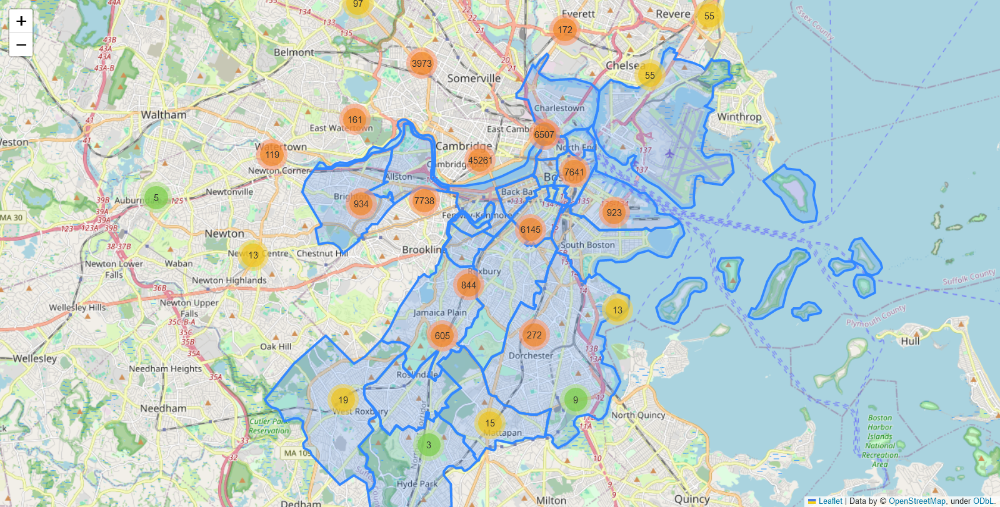

In [304]:
# map for month of January of rides across the city
# map for month of September of rides across the city

from folium.plugins import FastMarkerCluster

boston_map = folium.Map(location=[42.330377, -71.088132], zoom_start = 12.25)

layer_1 = folium.GeoJson(
    data=(open("data/Boston_Neighborhood_Boundaries_Approximated_by_2020_Census_Tracts.geojson", "r").read()),
    name="Neighborhoods")

layer_1.add_to(boston_map)

marker_cluster = FastMarkerCluster(data=months[0].loc[:, ['start station latitude', 'start station longitude']], ).add_to(boston_map)

convert_map_to_png(boston_map, '01_rides_map')
Image('01_rides_map.png')

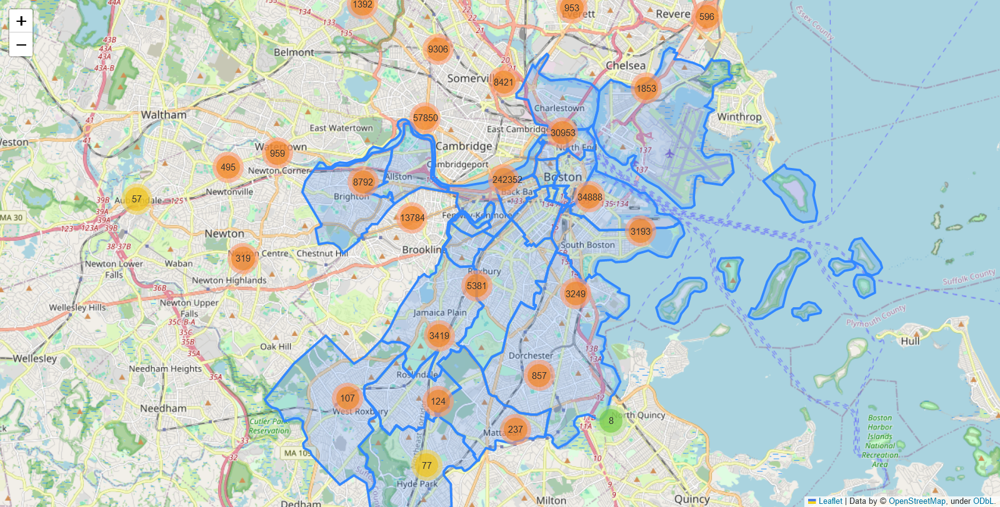

In [305]:
boston_map = folium.Map(location=[42.330377, -71.088132], zoom_start = 12.25)

layer_1 = folium.GeoJson(
    data=(open("data/Boston_Neighborhood_Boundaries_Approximated_by_2020_Census_Tracts.geojson", "r").read()),
    name="Neighborhoods")

layer_1.add_to(boston_map)

marker_cluster = FastMarkerCluster(data=months[6].loc[:, ['start station latitude', 'start station longitude']], ).add_to(boston_map)

convert_map_to_png(boston_map, '07_rides_map')
Image('07_rides_map.png')

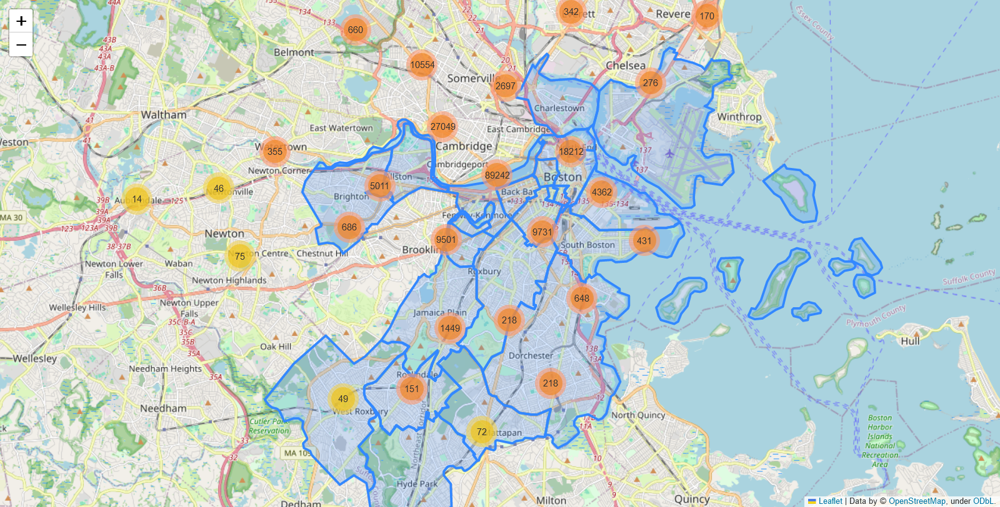

In [306]:
boston_map = folium.Map(location=[42.330377, -71.088132], zoom_start = 12.25)

layer_1 = folium.GeoJson(
    data=(open("data/Boston_Neighborhood_Boundaries_Approximated_by_2020_Census_Tracts.geojson", "r").read()),
    name="Neighborhoods")

layer_1.add_to(boston_map)

marker_cluster = FastMarkerCluster(data=months[2].loc[:, ['start station latitude', 'start station longitude']], ).add_to(boston_map)

convert_map_to_png(boston_map, '03_rides_map')
Image('03_rides_map.png')

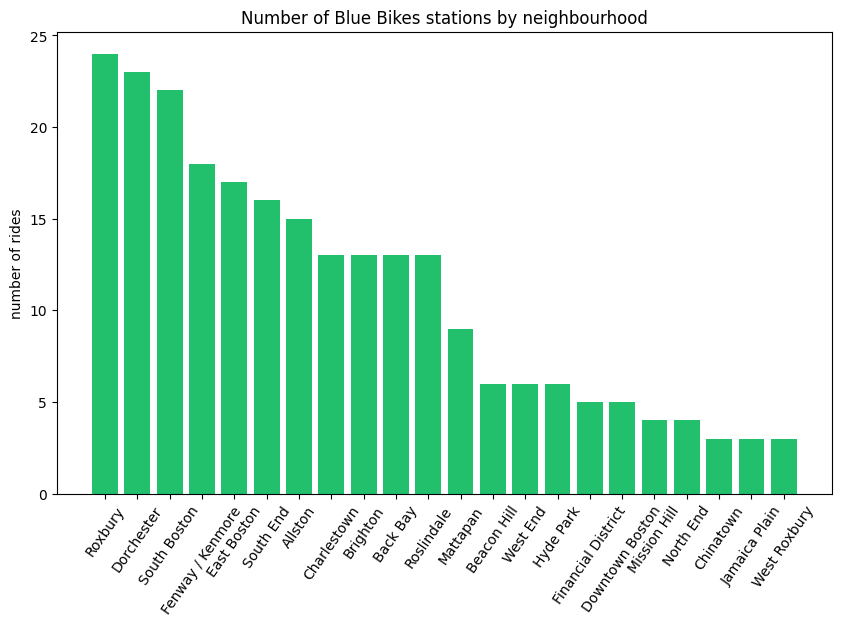

In [315]:
# number of stations by neighbourhood

fig, ax = plt.subplots(figsize=(10, 6))

neighbourhoods = pd.DataFrame(year_frequency["neighbourhood"].value_counts()).index
rides = pd.DataFrame(year_frequency["neighbourhood"].value_counts())["count"]
bar_labels = neighbourhoods

ax.bar(neighbourhoods, rides, label=bar_labels, color='#22c06c')

ax.set_ylabel("number of rides")
ax.set_title("Number of Blue Bikes stations by neighbourhood")
plt.xticks(rotation=55)

plt.savefig('stations_by_neighbourhood.png')
plt.show()

In [ ]:
# ethnic distribution of neighborhoods of most frequent start stations
# ethnic distribution of least frequent start stations
#
# compare with MBTA graphs of these distributions

In [325]:
census_data = pd.read_csv("data/census_data.csv", low_memory=False)
census_data.head()

,tract20_nbhd,P0020001,P0020005,P0020006,P0020002,P002aapi,P002others,P0040001,P0040005,P0040006,...,P0050006,P0050007,P0050008,P0050009,P0050010,H0010001,H0010002,H0010003,hhsize,zipcode
0,field concept,Total:,White alone,Black or African American alone,Hispanic or Latino,"Asian, Native Hawaiian and Pacific Islander al...","Other Races or Multiple Races, all ages",Total:,White alone,Black or African American alone,...,Other institutional facilities,Noninstitutionalized population:,College/University student housing,Military quarters,Other noninstitutional facilities,Total:,Occupied,Vacant,household size,zipcode
1,Allston,24904,12536,1326,3259,6271,1512,23140,11976,1184,...,0,3281,3214,0,67,10748,10027,721,2.156477511,02134
2,Back Bay,18190,13065,690,1208,2410,817,17042,12349,641,...,0,1610,1487,0,123,11524,10006,1518,1.630121927,"02199,02116,"
3,Beacon Hill,9336,7521,252,537,630,396,8603,6980,231,...,0,33,0,0,33,6037,5485,552,1.696080219,"02108,02114,"
4,Brighton,52047,32694,2414,5376,8703,2860,47657,30752,2076,...,56,3796,3493,0,303,23653,22535,1118,2.126292434,02135


In [326]:
census_data = census_data[["tract20_nbhd", "P0020001", "P0020005", "P0020006", "P0020002", "P002aapi", "P002others"]].iloc[1:]
census_data.head()

,tract20_nbhd,P0020001,P0020005,P0020006,P0020002,P002aapi,P002others
1,Allston,24904,12536,1326,3259,6271,1512
2,Back Bay,18190,13065,690,1208,2410,817
3,Beacon Hill,9336,7521,252,537,630,396
4,Brighton,52047,32694,2414,5376,8703,2860
5,Charlestown,19120,13626,990,2075,1650,779


In [327]:
new_column_names = {
    "tract20_nbhd": "Neighbourhood",
    'P0020001': 'Total Population',
    'P0020005': 'White',
    'P0020006': 'Black or African American',
    'P0020002': 'Hispanic or Latino',
    'P002aapi': 'Asian, Native Hawaiian and Pacific Islander',
    'P002others' : 'Other Races'

}

census_data.rename(columns=new_column_names, inplace=True)
census_data.head()

,Neighbourhood,Total Population,White,Black or African American,Hispanic or Latino,"Asian, Native Hawaiian and Pacific Islander",Other Races
1,Allston,24904,12536,1326,3259,6271,1512
2,Back Bay,18190,13065,690,1208,2410,817
3,Beacon Hill,9336,7521,252,537,630,396
4,Brighton,52047,32694,2414,5376,8703,2860
5,Charlestown,19120,13626,990,2075,1650,779


In [334]:
census_data["Neighbourhood"]

1                     Allston
2                    Back Bay
3                 Beacon Hill
4                    Brighton
5                 Charlestown
6                   Chinatown
7                  Dorchester
8                    Downtown
9                 East Boston
10                     Fenway
11                  Hyde Park
12              Jamaica Plain
13                   Longwood
14                   Mattapan
15               Mission Hill
16                  North End
17                 Roslindale
18                    Roxbury
19               South Boston
20    South Boston Waterfront
21                  South End
22                   West End
23               West Roxbury
Name: Neighbourhood, dtype: object

In [332]:
month = month_frequency[8]
month.sort_values("number of rides", ascending=False)[:5]

,start station name,start station latitude,start station longitude,number of rides,neighbourhood
10,Forsyth St at Huntington Ave,42.339202,-71.090511,9098,Fenway / Kenmore
25,Beacon St at Massachusetts Ave,42.350827,-71.089811,8373,Fenway / Kenmore
377,Commonwealth Ave at Agganis Way,42.351692,-71.119035,8046,Allston
57,Newbury St at Hereford St,42.348717,-71.085954,6887,Back Bay
30,Christian Science Plaza - Massachusetts Ave at...,42.343666,-71.085824,6834,Fenway / Kenmore


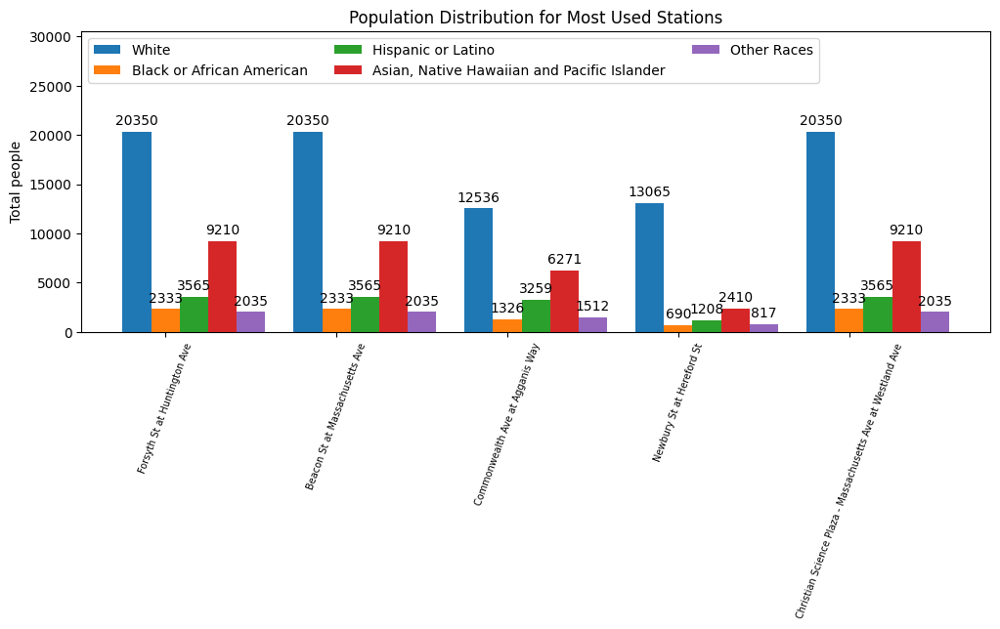

In [482]:
month = month_frequency[8]
month_name = calendar.month_name[9]

max_val = 0

fig, ax = plt.subplots(figsize=(12,4))

stations = month.sort_values("number of rides", ascending=False)[:5]["start station name"]
neighborhoods = month.sort_values("number of rides", ascending=False)[:5]["neighbourhood"]
categories = ["White", "Black or African American",  "Hispanic or Latino",
              "Asian, Native Hawaiian and Pacific Islander", "Other Races"]
populations = []
for n in neighborhoods:
    if n == "Fenway / Kenmore":
        n = "Fenway"
    populations.append(census_data[census_data["Neighbourhood"] == n][categories])
bar_labels = stations

populations = pd.concat(populations)
populations.index = stations

x = np.arange(len(populations)) 
width = 0.166667
multiplier = 0

for i in range(len(populations)):
    people = populations.iloc[:, i]
    people = [int(p) for p in list(people)]
    if max(people) > max_val:
        max_val = max(people)
    attribute = categories[i]
    offset = width * multiplier
    rects = ax.bar(x + offset, people, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel("Total people")
ax.set_title('Population Distribution for Most Used Stations')
ax.set_xticks(x + width, populations.index)
ax.legend(loc='upper left', ncols=3)
plt.ylim(0, max_val * 1.5)
plt.xticks(rotation=70)
ax.tick_params(axis='x', labelsize=7)

plt.savefig('most_used_demographics.png')
plt.show()

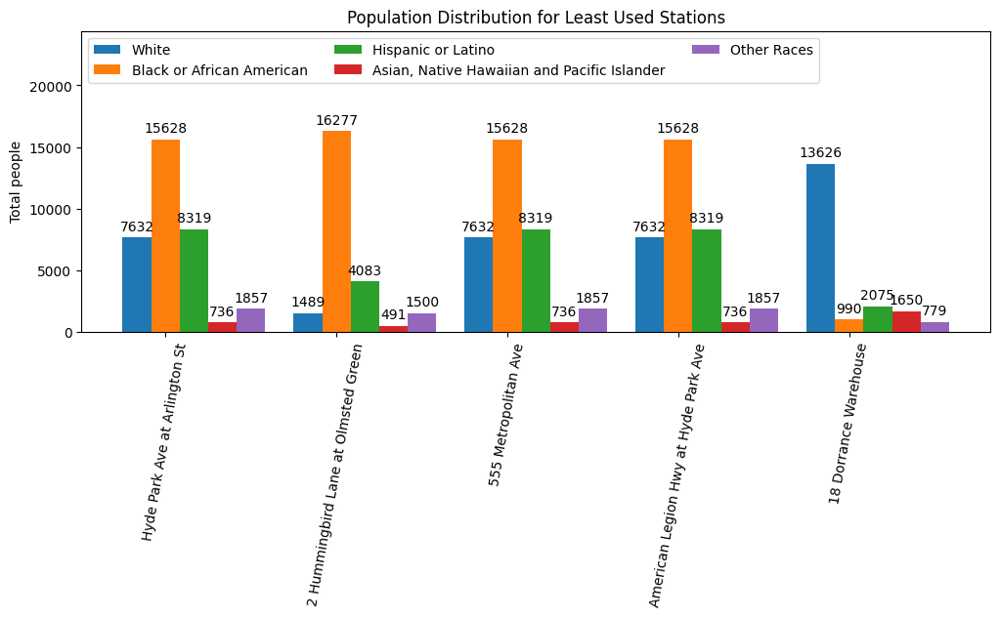

In [477]:
month = month_frequency[8]
month_name = calendar.month_name[9]
max_val = 0

fig, ax = plt.subplots(figsize=(12,4))

stations = month.sort_values("number of rides", ascending=False)[-5:]["start station name"]
neighborhoods = month.sort_values("number of rides", ascending=False)[-5:]["neighbourhood"]
categories = ["White", "Black or African American",  "Hispanic or Latino",
              "Asian, Native Hawaiian and Pacific Islander", "Other Races"]
populations = []
for n in neighborhoods:
    if n == "Fenway / Kenmore":
        n = "Fenway"
    populations.append(census_data[census_data["Neighbourhood"] == n][categories])
bar_labels = stations

populations = pd.concat(populations)
populations.index = stations

x = np.arange(len(populations)) 
width = 0.166667
multiplier = 0

for i in range(len(populations)):
    people = populations.iloc[:, i]
    people = [int(p) for p in list(people)]
    if max(people) > max_val:
        max_val = max(people)
    attribute = categories[i]
    offset = width * multiplier
    rects = ax.bar(x + offset, people, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel("Total people")
ax.set_title('Population Distribution for Least Used Stations')
ax.set_xticks(x + width, populations.index)
ax.legend(loc='upper left', ncols=3)
plt.xticks(rotation=80)
plt.ylim(0, max_val * 1.5)

plt.savefig('least_used_demographics.png')
plt.show()

C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3974648078.py:20: DeprecationWarning: DataFrame._data is deprecated and will be removed in a future version. Use public APIs instead.
  data = pd.DataFrame(stations, populations)
C:\Users\pjbro\AppData\Local\Temp\ipykernel_24352\3974648078.py:28: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


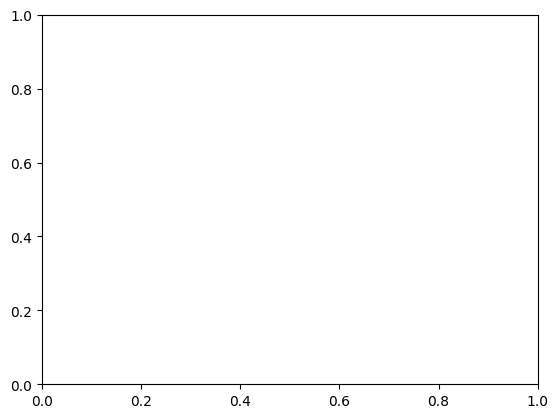

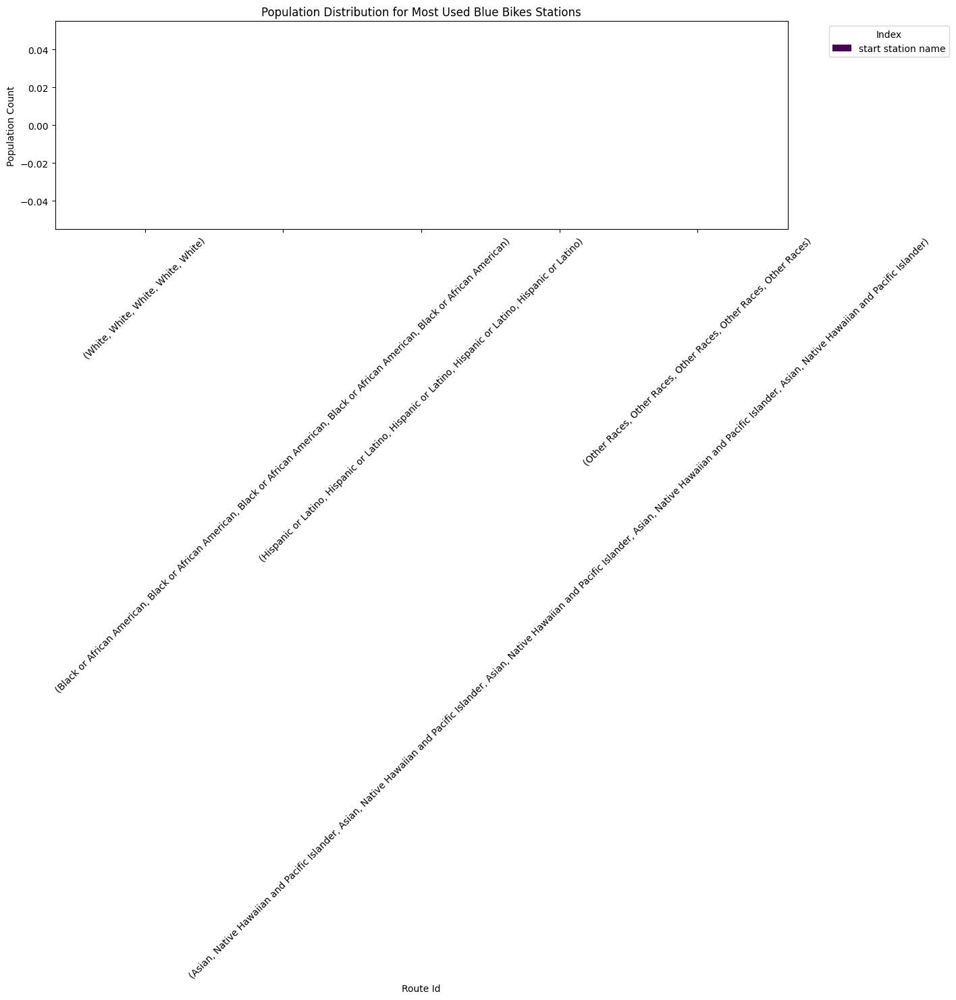

In [347]:
# demographics of 5 most accessible Blue Bikes stations in September 2022



month = month_frequency[8]
month_name = calendar.month_name[9]

fig, ax = plt.subplots()

stations = month.sort_values("number of rides", ascending=False)[:5]["start station name"]
neighborhoods = month.sort_values("number of rides", ascending=False)[:5]["neighbourhood"]
populations = []
for n in neighborhoods:
    if n == "Fenway / Kenmore":
        n = "Fenway"
    populations.append(census_data[census_data["Neighbourhood"] == n][["White", "Black or African American",  "Hispanic or Latino",
                                                                     "Asian, Native Hawaiian and Pacific Islander", "Other Races"]])
bar_labels = stations

data = pd.DataFrame(stations, populations)

data.plot(kind='bar', figsize=(14,4), colormap='viridis',width=0.8)
plt.xlabel('Route Id')
plt.ylabel('Population Count')
plt.title('Population Distribution for Most Used Blue Bikes Stations')
plt.legend(title='Index', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

img_name = f'september_most_frequent_neighbourhood_distribution.png'

plt.savefig(img_name)
plt.show()

In [ ]:
# demographics of 5 least accessible Blue Bikes stations in September 2022

In [5]:
# Question: what are the demographics of those who have access to Blue Bikes? Those that do not?


In [6]:
# Question: are the areas where people have less access to Blue Bikes the same as those
# who have less access to MBTA buses?